In [1]:
# Import packages we'll need later on in this tutorial
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.colors import Normalize 
import seaborn as sns
import scipy.stats as stats
import glob
import netCDF4 as nc

import geopandas as gpd
from shapely.geometry import Point
from matplotlib.colors import TwoSlopeNorm

import bw2data as bd
import bw2io as bi
import bw2calc as bc
import bw2analyzer as bwa

 # or LogNorm for skewed data

In [2]:
path = r'C:\Users\dhuber\OneDrive - Vrije Universiteit Brussel\DominikMaeva\01_Projects\05_WIMBY\05_LCA\Evaulation\Fleet_results' # use your path
all_files = glob.glob(os.path.join(path , "*.csv"))

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    li.append(df)

frame = pd.concat(li, axis=0, ignore_index=True)

In [3]:
frame.head()

,Unnamed: 0,P_rated_kW,Hub_height_m,Diameter_m,Longitude,Latitude,ISO_code,Offshore,Commissioning_date,Lifetime_production_kWh,Capacity_factors,turbine_age,Cluster,park_size,Input,Assembly,Transport,Maintenance,Disposal,Total
0,1567,3000,135,101,17.04251,47.79188,AT,0,2014-08-01,126144000.0,0.24,10,0,80,0.017128,0.002733,0.002403,0.000003,-0.000074,0.022193
1,1568,3000,135,101,17.04886,47.79488,AT,0,2014-08-01,126144000.0,0.24,10,0,80,0.017121,0.002732,0.002403,0.000003,-0.000073,0.022186
2,1569,3000,135,101,17.03775,47.79594,AT,0,2014-08-01,126144000.0,0.24,10,0,80,0.017123,0.002401,0.002403,0.000003,-0.000076,0.021854
3,1570,3000,135,101,17.04325,47.79821,AT,0,2014-08-01,126144000.0,0.24,10,0,80,0.017117,0.002732,0.002403,0.000003,-0.000072,0.022183
4,1571,3000,135,101,17.05174,47.79914,AT,0,2014-08-01,126144000.0,0.24,10,0,80,0.017112,0.002732,0.002403,0.000003,-0.000071,0.022179


In [4]:
print(len(frame))
print(frame.columns)

77552
Index(['Unnamed: 0', 'P_rated_kW', 'Hub_height_m', 'Diameter_m', 'Longitude',
       'Latitude', 'ISO_code', 'Offshore', 'Commissioning_date',
       'Lifetime_production_kWh', 'Capacity_factors', 'turbine_age', 'Cluster',
       'park_size', 'Input', 'Assembly', 'Transport', 'Maintenance',
       'Disposal', 'Total'],
      dtype='object')


In [5]:
#Check the format of my coordinates
# Turn df into GeoDataFrame
gdf_turbines = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df['Longitude'], df['Latitude']),
    crs="EPSG:4326"   # declare CRS since we know it's lat/lon degrees
)

print(gdf_turbines.crs)


EPSG:4326


In [6]:
frame['ISO_code'].unique()

array(['AT', 'BA', 'BE', 'BG', 'BY', 'CH', 'CY', 'CZ', 'DE', 'DK', 'EE',
       'ES', 'FI', 'FO', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IS', 'IT',
       'LT', 'LU', 'LV', 'ME', 'MK', 'NL', 'NO', 'PL', 'PT', 'RO', 'RS',
       'SE', 'SI', 'SK', 'UA', 'XK'], dtype=object)

In [7]:
print(len(frame[frame['Offshore'] ==1]))
print(len(frame[frame['Offshore'] ==1])/len(frame)*100)

5379
6.935991334846296


In [8]:
offshore = frame[frame['Offshore'] ==1]
offshore.columns

Index(['Unnamed: 0', 'P_rated_kW', 'Hub_height_m', 'Diameter_m', 'Longitude',
       'Latitude', 'ISO_code', 'Offshore', 'Commissioning_date',
       'Lifetime_production_kWh', 'Capacity_factors', 'turbine_age', 'Cluster',
       'park_size', 'Input', 'Assembly', 'Transport', 'Maintenance',
       'Disposal', 'Total'],
      dtype='object')

In [9]:
import netCDF4 as nc
import numpy as np

# Load once
bathymetry = nc.Dataset("C:/Users/dhuber/OneDrive - Vrije Universiteit Brussel/DominikMaeva/01_Projects/05_WIMBY/05_LCA/Github_repo/WIMBY_LCA/wimby_lca/data/GEBCO_2024_sub_ice_topo.nc")

latitudes = bathymetry.variables['lat'][:]
longitudes = bathymetry.variables['lon'][:]
elevation = bathymetry.variables['elevation']

In [10]:
def find_nearest(array, value):
    return (np.abs(array - value)).argmin()

def get_sea_depth(lat, lon):
    lat_idx = find_nearest(latitudes, lat)
    lon_idx = find_nearest(longitudes, lon)
    return float(elevation[lat_idx, lon_idx])

In [11]:
offshore["sea_depth_m"] = [
    get_sea_depth(lat, lon)
    for lat, lon in zip(offshore["Latitude"], offshore["Longitude"])
]

C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\3528350742.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  offshore["sea_depth_m"] = [


In [12]:
import pandas as pd
import geopandas as gpd
from shapely import wkt
from geopy.distance import geodesic

# Load once
bus_data = pd.read_csv("C:/Users/dhuber/OneDrive - Vrije Universiteit Brussel/DominikMaeva/01_Projects/05_WIMBY/05_LCA/Github_repo/WIMBY_LCA/wimby_lca/data/buses.csv")
bus_data['geometry'] = bus_data['geometry'].apply(wkt.loads)
bus_gdf = gpd.GeoDataFrame(bus_data, geometry='geometry', crs="EPSG:4326")

In [13]:
def closest_distance_single(lat, lon, bus_gdf):
    turbine_location = (lat, lon)
    
    distances = bus_gdf.geometry.apply(
        lambda x: geodesic(turbine_location, (x.y, x.x)).meters
    )
    
    return distances.min()

In [14]:
def calculate_closest_distance(lon, lat):
    """
    Calculate the closest distance from a wind turbine location to the nearest bus in the bus_gdf.
    
    Parameters:
        lon (float): Longitude of the turbine.
        lat (float): Latitude of the turbine.
        bus_gdf (GeoDataFrame): GeoDataFrame containing bus locations.
        print_stats (bool): If True, print summary statistics and plot results. Default is False.
    
    Returns:
        float: Closest distance in meters.
    """
    # Load and prepare bus data
    bus_data = pd.read_csv("C:/Users/dhuber/OneDrive - Vrije Universiteit Brussel/DominikMaeva/01_Projects/05_WIMBY/05_LCA/Github_repo/WIMBY_LCA/wimby_lca/data/buses.csv")
    #bus_data = pd.read_csv(_DATA_DIR / "transformers.csv")
    bus_data['geometry'] = bus_data['geometry'].apply(wkt.loads)
    bus_gdf = gpd.GeoDataFrame(bus_data, geometry='geometry', crs="EPSG:4326")

    turbine_location = (lat, lon)
    
    # Calculate distances in meters
    bus_gdf['distance_meters'] = bus_gdf.geometry.apply(lambda x: geodesic(turbine_location, (x.y, x.x)).meters)
    
    # Get the closest distance
    closest_distance = bus_gdf['distance_meters'].min()

    # Print statistics and show plots if print_stats is True

    return closest_distance

In [15]:
import pandas as pd
import geopandas as gpd
import numpy as np
from shapely import wkt
from scipy.spatial import cKDTree

# --- Load buses once ---
bus_data = pd.read_csv(
    r"C:\Users\dhuber\OneDrive - Vrije Universiteit Brussel\DominikMaeva\01_Projects\05_WIMBY\05_LCA\Github_repo\WIMBY_LCA\wimby_lca\data\buses.csv"
)
bus_data["geometry"] = bus_data["geometry"].apply(wkt.loads)
bus_gdf = gpd.GeoDataFrame(bus_data, geometry="geometry", crs="EPSG:4326")

# --- Build offshore GeoDataFrame ---
gdf_offshore = gpd.GeoDataFrame(
    offshore.copy(),
    geometry=gpd.points_from_xy(offshore["Longitude"], offshore["Latitude"]),
    crs="EPSG:4326"
)

# --- Project both to a metric CRS for Europe ---
gdf_offshore = gdf_offshore.to_crs(epsg=3035)
bus_gdf = bus_gdf.to_crs(epsg=3035)

# --- Extract coordinates ---
bus_coords = np.array([(geom.x, geom.y) for geom in bus_gdf.geometry])
turbine_coords = np.array([(geom.x, geom.y) for geom in gdf_offshore.geometry])

# --- KDTree nearest-neighbor search ---
tree = cKDTree(bus_coords)
distances_m, indices = tree.query(turbine_coords, k=1)

# --- Add results back ---
offshore["dist_to_grid_m"] = distances_m
offshore["dist_to_grid_km"] = distances_m / 1000

C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\1964787356.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  offshore["dist_to_grid_m"] = distances_m
C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\1964787356.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  offshore["dist_to_grid_km"] = distances_m / 1000


In [16]:
offshore.columns

Index(['Unnamed: 0', 'P_rated_kW', 'Hub_height_m', 'Diameter_m', 'Longitude',
       'Latitude', 'ISO_code', 'Offshore', 'Commissioning_date',
       'Lifetime_production_kWh', 'Capacity_factors', 'turbine_age', 'Cluster',
       'park_size', 'Input', 'Assembly', 'Transport', 'Maintenance',
       'Disposal', 'Total', 'sea_depth_m', 'dist_to_grid_m',
       'dist_to_grid_km'],
      dtype='object')

In [17]:
offshore["dist_to_grid_km"].describe()

count    5379.000000
mean       27.200544
std        22.195419
min         0.291332
25%         8.963593
50%        20.735383
75%        38.484331
max        92.589156
Name: dist_to_grid_km, dtype: float64

In [18]:
offshore

,Unnamed: 0,P_rated_kW,Hub_height_m,Diameter_m,Longitude,Latitude,ISO_code,Offshore,Commissioning_date,Lifetime_production_kWh,...,park_size,Input,Assembly,Transport,Maintenance,Disposal,Total,sea_depth_m,dist_to_grid_m,dist_to_grid_km
1788,36234,6000,100,151,2.84000,51.69000,BE,1,2013-12-01,3.574080e+08,...,200,0.024253,0.004029,0.001882,NaN,-0.000023,0.030141,-34.0,9559.287910,9.559288
1824,75947,6150,95,126,2.92817,51.52083,BE,1,2013-07-01,4.296819e+08,...,200,0.007446,0.001001,0.001067,NaN,-0.000018,0.009496,-16.0,4468.270414,4.468270
1825,75948,6150,95,126,2.90667,51.53383,BE,1,2013-07-01,4.296819e+08,...,200,0.007466,0.001002,0.001067,NaN,-0.000018,0.009517,-18.0,6304.374112,6.304374
1826,75949,6150,95,126,2.96050,51.53433,BE,1,2013-07-01,4.296819e+08,...,200,0.007417,0.000999,0.001067,NaN,-0.000018,0.009466,-13.0,3162.891370,3.162891
1827,75950,6150,95,126,2.97850,51.54483,BE,1,2013-07-01,4.296819e+08,...,200,0.007409,0.000998,0.001067,NaN,-0.000018,0.009456,-12.0,3603.066917,3.603067
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76912,72780,2300,70,90,12.76549,55.51547,SE,1,2007-12-01,1.370064e+08,...,48,0.009106,0.000992,0.001187,NaN,-0.000040,0.011244,-7.0,20575.686990,20.575687
76913,72781,2300,70,90,12.76142,55.51272,SE,1,2007-12-01,1.370064e+08,...,48,0.009134,0.000994,0.001187,NaN,-0.000040,0.011274,-8.0,20533.745204,20.533745
76914,72782,2300,70,90,12.76933,55.52227,SE,1,2007-10-05,1.370064e+08,...,48,0.009105,0.000992,0.001187,NaN,-0.000040,0.011243,-7.0,20159.977581,20.159978
76915,72783,2300,70,90,12.76527,55.51952,SE,1,2007-10-08,1.370064e+08,...,48,0.009049,0.000987,0.001187,NaN,-0.000040,0.011183,-5.0,20222.016300,20.222016


In [19]:
offshore['sea_depth_m'].describe()

count    5379.000000
mean      -21.958542
std        13.864092
min      -207.000000
25%       -30.000000
50%       -23.000000
75%       -16.000000
max        80.000000
Name: sea_depth_m, dtype: float64

In [20]:
len(offshore)

5379

In [21]:
frame[frame['Offshore']==1]

,Unnamed: 0,P_rated_kW,Hub_height_m,Diameter_m,Longitude,Latitude,ISO_code,Offshore,Commissioning_date,Lifetime_production_kWh,Capacity_factors,turbine_age,Cluster,park_size,Input,Assembly,Transport,Maintenance,Disposal,Total
1788,36234,6000,100,151,2.84000,51.69000,BE,1,2013-12-01,3.574080e+08,0.340000,11,5214,200,0.024253,0.004029,0.001882,NaN,-0.000023,0.030141
1824,75947,6150,95,126,2.92817,51.52083,BE,1,2013-07-01,4.296819e+08,0.404323,11,5214,200,0.007446,0.001001,0.001067,NaN,-0.000018,0.009496
1825,75948,6150,95,126,2.90667,51.53383,BE,1,2013-07-01,4.296819e+08,0.404323,11,5214,200,0.007466,0.001002,0.001067,NaN,-0.000018,0.009517
1826,75949,6150,95,126,2.96050,51.53433,BE,1,2013-07-01,4.296819e+08,0.404323,11,5214,200,0.007417,0.000999,0.001067,NaN,-0.000018,0.009466
1827,75950,6150,95,126,2.97850,51.54483,BE,1,2013-07-01,4.296819e+08,0.404323,11,5214,200,0.007409,0.000998,0.001067,NaN,-0.000018,0.009456
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76912,72780,2300,70,90,12.76549,55.51547,SE,1,2007-12-01,1.370064e+08,0.340000,17,5278,48,0.009106,0.000992,0.001187,NaN,-0.000040,0.011244
76913,72781,2300,70,90,12.76142,55.51272,SE,1,2007-12-01,1.370064e+08,0.340000,17,5278,48,0.009134,0.000994,0.001187,NaN,-0.000040,0.011274
76914,72782,2300,70,90,12.76933,55.52227,SE,1,2007-10-05,1.370064e+08,0.340000,17,5278,48,0.009105,0.000992,0.001187,NaN,-0.000040,0.011243
76915,72783,2300,70,90,12.76527,55.51952,SE,1,2007-10-08,1.370064e+08,0.340000,17,5278,48,0.009049,0.000987,0.001187,NaN,-0.000040,0.011183


In [22]:
(offshore['sea_depth_m'] > 0).sum()

70

In [23]:
import pandas as pd

# Work on a clean copy
df = offshore.copy()

# Filter offshore turbines with unrealistic depth
df_problem = df[
    (df["Offshore"] == 1) &
    (df["sea_depth_m"] > 0)
].copy()

print(f"Number of problematic turbines: {len(df_problem)}")

Number of problematic turbines: 70


In [24]:
problem_table = df_problem[[
    "ISO_code",
    "Latitude",
    "Longitude",
    "sea_depth_m",
    "Total",
    "Capacity_factors",
    "Lifetime_production_kWh"
]].sort_values("sea_depth_m", ascending=False)

print(problem_table.head(10))
print(len(problem_table))
print(problem_table["Total"].describe())

      ISO_code  Latitude  Longitude  sea_depth_m     Total  Capacity_factors  \
52611       GB  53.36058   -4.44815         80.0  0.011661          0.333112   
52606       GB  53.36146   -4.44916         80.0  0.011660          0.333112   
52599       GB  53.36004   -4.44687         80.0  0.011662          0.333112   
52593       GB  53.35968   -4.44545         79.0  0.011663          0.333112   
52600       GB  53.35917   -4.45710         74.0  0.011661          0.333112   
52596       GB  53.35976   -4.45815         74.0  0.011660          0.333112   
52609       GB  53.35779   -4.45180         72.0  0.011664          0.333112   
52610       GB  53.36091   -4.46043         69.0  0.011659          0.333112   
52607       GB  53.36036   -4.45931         69.0  0.011659          0.333112   
52608       GB  53.36370   -4.47744         67.0  0.011654          0.333112   

       Lifetime_production_kWh  
52611             2.072225e+08  
52606             2.072225e+08  
52599             2.

In [25]:
problem_table.to_csv("problematic_offshore_turbines.csv", index=False)

In [26]:
country_counts = df_problem["ISO_code"].value_counts().reset_index()
country_counts.columns = ["Country", "Number of problematic turbines"]

print(country_counts)


  Country  Number of problematic turbines
0      GB                              56
1      SE                              10
2      FI                               3
3      NO                               1


In [27]:
share = (
    df_problem["ISO_code"].value_counts() /
    df[df["Offshore"] == 1]["ISO_code"].value_counts()
) * 100

print(share.round(1))

ISO_code
BE     NaN
DE     NaN
DK     NaN
FI    15.8
FR     NaN
GB     2.5
IE     NaN
NL     NaN
NO    33.3
SE    12.7
Name: count, dtype: float64


Total offshore turbines: 5379
Valid offshore turbines (sea_depth_m ≤ 0): 5309
Problematic offshore turbines (sea_depth_m > 0): 70
  Country  Number of problematic turbines
0      GB                              56
1      SE                              10
2      FI                               3
3      NO                               1

Share of problematic turbines per country (%):
ISO_code
BE     NaN
DE     NaN
DK     NaN
FI    15.8
FR     NaN
GB     2.5
IE     NaN
NL     NaN
NO    33.3
SE    12.7
Name: count, dtype: float64


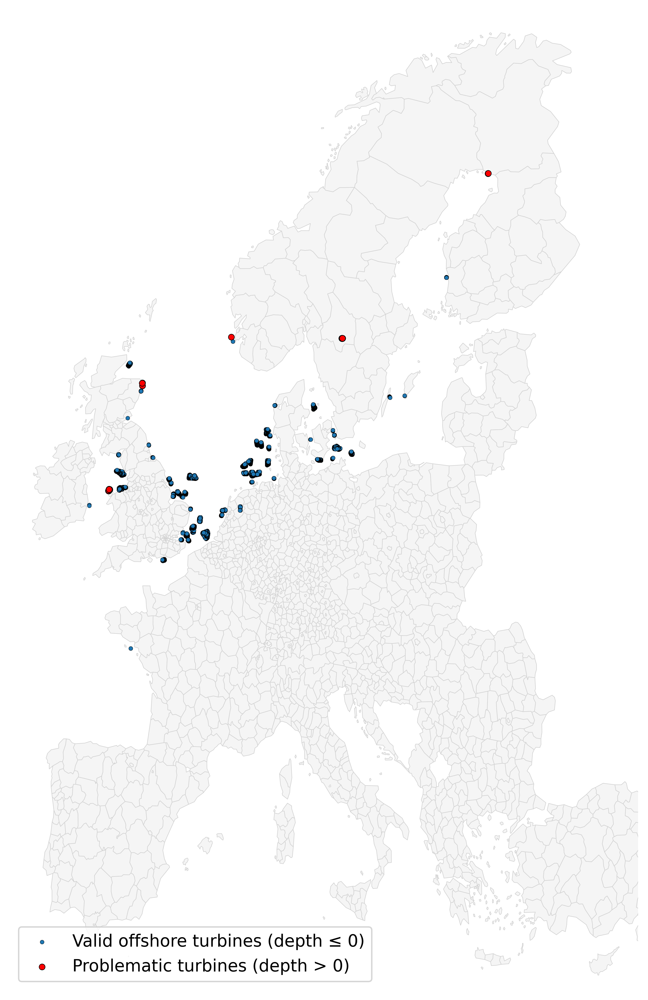

In [28]:
# --- Imports ---
import geopandas as gpd
import matplotlib.pyplot as plt

# --- Inputs ---
nuts_path = r"C:\Users\dhuber\OneDrive - Vrije Universiteit Brussel\DominikMaeva\01_Projects\05_WIMBY\05_LCA\Evaulation\Fleet_results\NUTS_RG_20M_2016_4326.gpkg"

# --- 1) Use your current dataframe ---
df = offshore.copy()

# --- 2) Build GeoDataFrame ---
gdf_turbines = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["Longitude"], df["Latitude"]),
    crs="EPSG:4326"
)

# --- 3) Load NUTS polygons ---
nuts = gpd.read_file(nuts_path)
if nuts.crs != "EPSG:4326":
    nuts = nuts.to_crs("EPSG:4326")

nuts3 = nuts.loc[nuts["LEVL_CODE"] == 3, ["NUTS_ID", "CNTR_CODE", "geometry"]].copy()

# --- 4) Keep only offshore turbines ---
g_offshore = gdf_turbines[gdf_turbines["Offshore"] == 1].copy()

print(f"Total offshore turbines: {len(g_offshore)}")

# --- 5) Split into valid vs problematic turbines ---
g_problem = g_offshore[g_offshore["sea_depth_m"] > 0].copy()
g_valid = g_offshore[g_offshore["sea_depth_m"] <= 0].copy()

print(f"Valid offshore turbines (sea_depth_m ≤ 0): {len(g_valid)}")
print(f"Problematic offshore turbines (sea_depth_m > 0): {len(g_problem)}")

# --- 6) Country diagnostics (same as before, just cleaner) ---
if not g_problem.empty:
    country_counts = g_problem["ISO_code"].value_counts().reset_index()
    country_counts.columns = ["Country", "Number of problematic turbines"]
    print(country_counts)

    share = (
        g_problem["ISO_code"].value_counts() /
        g_offshore["ISO_code"].value_counts()
    ) * 100
    print("\nShare of problematic turbines per country (%):")
    print(share.round(1))

# --- 7) Plot ---
plt.rcParams["figure.dpi"] = 500
fig, ax = plt.subplots(figsize=(12, 10))

# Background color (water)
ax.set_facecolor("#e6f2ff")

# NUTS regions
nuts3.plot(
    ax=ax,
    color="whitesmoke",
    edgecolor="lightgray",
    linewidth=0.4,
    zorder=1
)

# Valid offshore turbines
if not g_valid.empty:
    g_valid.plot(
        ax=ax,
        color="#1f78b4",
        markersize=8,
        marker="o",
        edgecolor="black",
        linewidth=0.2,
        label="Valid offshore turbines (depth ≤ 0)",
        zorder=3
    )

# Problematic offshore turbines
if not g_problem.empty:
    g_problem.plot(
        ax=ax,
        color="red",
        markersize=18,
        marker="o",
        edgecolor="black",
        linewidth=0.4,
        label="Problematic turbines (depth > 0)",
        zorder=4
    )

# --- Cosmetics ---
ax.set_axis_off()
ax.set_xlim(-12, 36)
ax.set_ylim(34, 72)

ax.legend(loc="lower left", fontsize=12, frameon=True)

plt.tight_layout()
plt.show()

# Optional save
# fig.savefig("offshore_problematic_seadepth_map.png", dpi=300, bbox_inches="tight")


In [29]:
offshore_clean = df[
    (df["Offshore"] == 1) &
    (df["sea_depth_m"] <= 0)
].copy()

print(len(offshore_clean))
print(offshore_clean["Total"].describe())

5309
count    5309.000000
mean        0.016641
std         0.008214
min         0.007375
25%         0.011484
50%         0.013717
75%         0.015658
max         0.046107
Name: Total, dtype: float64


In [30]:
print(len(df), "total turbines")
print(len(offshore_clean), "clean offshore turbines")
print(df_problem.shape[0], "removed problematic turbines")

5379 total turbines
5309 clean offshore turbines
70 removed problematic turbines


In [31]:
offshore_clean.columns

Index(['Unnamed: 0', 'P_rated_kW', 'Hub_height_m', 'Diameter_m', 'Longitude',
       'Latitude', 'ISO_code', 'Offshore', 'Commissioning_date',
       'Lifetime_production_kWh', 'Capacity_factors', 'turbine_age', 'Cluster',
       'park_size', 'Input', 'Assembly', 'Transport', 'Maintenance',
       'Disposal', 'Total', 'sea_depth_m', 'dist_to_grid_m',
       'dist_to_grid_km'],
      dtype='object')

In [32]:
offshore_clean["Total_g"] = offshore_clean["Total"] * 1000

In [33]:
offshore_clean["sea_depth_m"] = offshore_clean["sea_depth_m"].abs()

def classify_depth(d):
    if d <= 30:
        return "Monopile (≤30m)"
    elif d <= 60:
        return "Semi-submersible  (30–60m)"
    else:
        return "Spar-buoy (>60m)"

offshore_clean["foundation_type"] = offshore_clean["sea_depth_m"].apply(classify_depth)


In [34]:
offshore_clean["foundation_type"].value_counts()


foundation_type
Monopile (≤30m)               4065
Semi-submersible  (30–60m)    1242
Spar-buoy (>60m)                 2
Name: count, dtype: int64

In [35]:
4065+1242+2

5309

C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\671524655.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


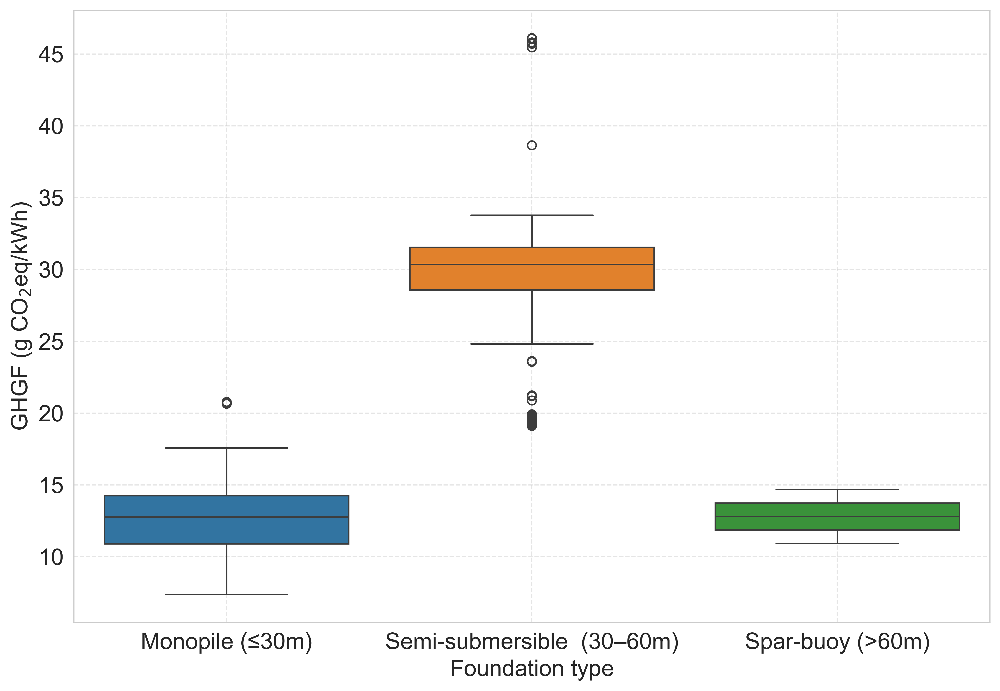

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

mpl.rcParams['text.usetex'] = False
mpl.rcParams['mathtext.fontset'] = 'dejavusans'
mpl.rcParams['font.family'] = 'DejaVu Sans'

sns.set_style("whitegrid")
plt.rcParams.update({'font.size': 16})

order = ["Monopile (≤30m)", "Semi-submersible  (30–60m)", "Spar-buoy (>60m)"]

fig, ax = plt.subplots(figsize=(10, 7))

sns.boxplot(
    data=offshore_clean,
    x="foundation_type",
    y="Total_g",
    order=order,
    palette=["#1f77b4", "#ff7f0e", "#2ca02c"],
    ax=ax,
)

ax.set_xlabel("Foundation type")
ax.set_ylabel(r"GHGF (g CO$_2$eq/kWh)")
ax.grid(True, linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()


In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

def plot_foundation_group_5(df, foundation_name, add_trend=True):

    df = df[df["foundation_type"] == foundation_name].copy()

    if df.shape[0] < 50:
        print(f"Skipping {foundation_name}: sample too small ({df.shape[0]})")
        return

    # Convert capacity factor into %
    df["CF_percent"] = df["Capacity_factors"] * 100

    # Global styling
    sns.set_style("whitegrid")
    plt.rcParams.update({
        'font.size': 16,          # FONT SIZE EVERYWHERE
        'axes.titlesize': 16,
        'axes.labelsize': 16,
        'xtick.labelsize': 16,
        'ytick.labelsize': 16,
        'figure.dpi': 500         # HIGH RESOLUTION EXPORT
    })

    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    ax1, ax2, ax3, ax4 = axes.flatten()

    # Colors consistent with boxplot
    color_map = {
        "Monopile (≤30m)": "#1f77b4",
        "Semi-submersible  (30–60m)": "#ff7f0e",
        "Spar-buoy (>60m)": "#2ca02c"
    }
    color = color_map[foundation_name]

    # --- Helper: regression + annotation ---
    def add_regression(ax, x, y):
        if add_trend:
            slope, intercept, r, p, stderr = linregress(x, y)
            sns.regplot(
                x=x, y=y, scatter=False, ax=ax,
                color="black", line_kws={"linewidth": 1}
            )
            ax.text(
                0.05, 0.95,
                f"r² = {r**2:.2f}\np = {p:.3g}",
                transform=ax.transAxes,
                va="top", fontsize=16
            )

    # ------------------------------
    # Plot 1: GHGF vs Sea Depth
    # ------------------------------
    sns.scatterplot(data=df, x="sea_depth_m", y="Total_g", ax=ax1,
                    alpha=0.5, color=color)
    add_regression(ax1, df["sea_depth_m"], df["Total_g"])
    ax1.set_xlim(left=0)
    ax1.set_ylim(0, 60)
    ax1.set_xlabel("Sea depth (m)")
    ax1.set_ylabel(r"GHGF (g CO$_2$eq/kWh)")
    ax1.grid(True, linestyle="--", alpha=0.5)

    # ------------------------------
    # Plot 2: GHGF vs Capacity Factor
    # ------------------------------
    sns.scatterplot(data=df, x="CF_percent", y="Total_g", ax=ax2,
                    alpha=0.5, color=color)
    add_regression(ax2, df["CF_percent"], df["Total_g"])
    ax2.set_xlim(0, 100)
    ax2.set_ylim(0, 60)
    ax2.set_xlabel("Capacity factor (%)")
    ax2.set_ylabel(r"GHGF (g CO$_2$eq/kWh)")
    ax2.grid(True, linestyle="--", alpha=0.5)

    # ------------------------------
    # Plot 3: Capacity Factor vs Depth
    # ------------------------------
    sns.scatterplot(data=df, x="sea_depth_m", y="CF_percent", ax=ax3,
                    alpha=0.5, color=color)
    add_regression(ax3, df["sea_depth_m"], df["CF_percent"])
    ax3.set_xlim(left=0)
    ax3.set_ylim(0, 100)
    ax3.set_xlabel("Sea depth (m)")
    ax3.set_ylabel("Capacity factor (%)")
    ax3.grid(True, linestyle="--", alpha=0.5)

    # ------------------------------
    # Plot 4: GHGF vs Rated Power
    # ------------------------------
    sns.scatterplot(data=df, x="P_rated_kW", y="Total_g", ax=ax4,
                    alpha=0.5, color=color)
    add_regression(ax4, df["P_rated_kW"], df["Total_g"])
    ax4.set_xlim(left=0)
    ax4.set_ylim(0, 60)
    ax4.set_xlabel("Rated power (kW)")
    ax4.set_ylabel(r"GHGF (g CO$_2$eq/kWh)")
    ax4.grid(True, linestyle="--", alpha=0.5)

    plt.suptitle(f"Visual Analysis for {foundation_name}", fontsize=18)
    plt.tight_layout()
    plt.show()


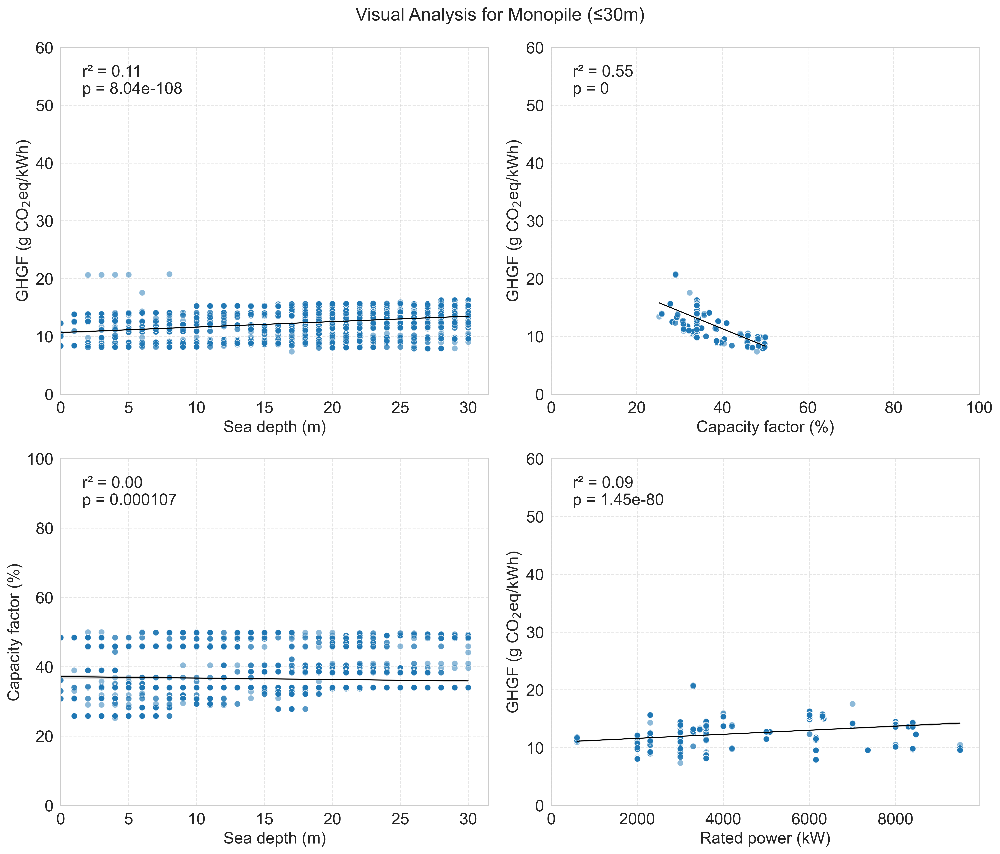

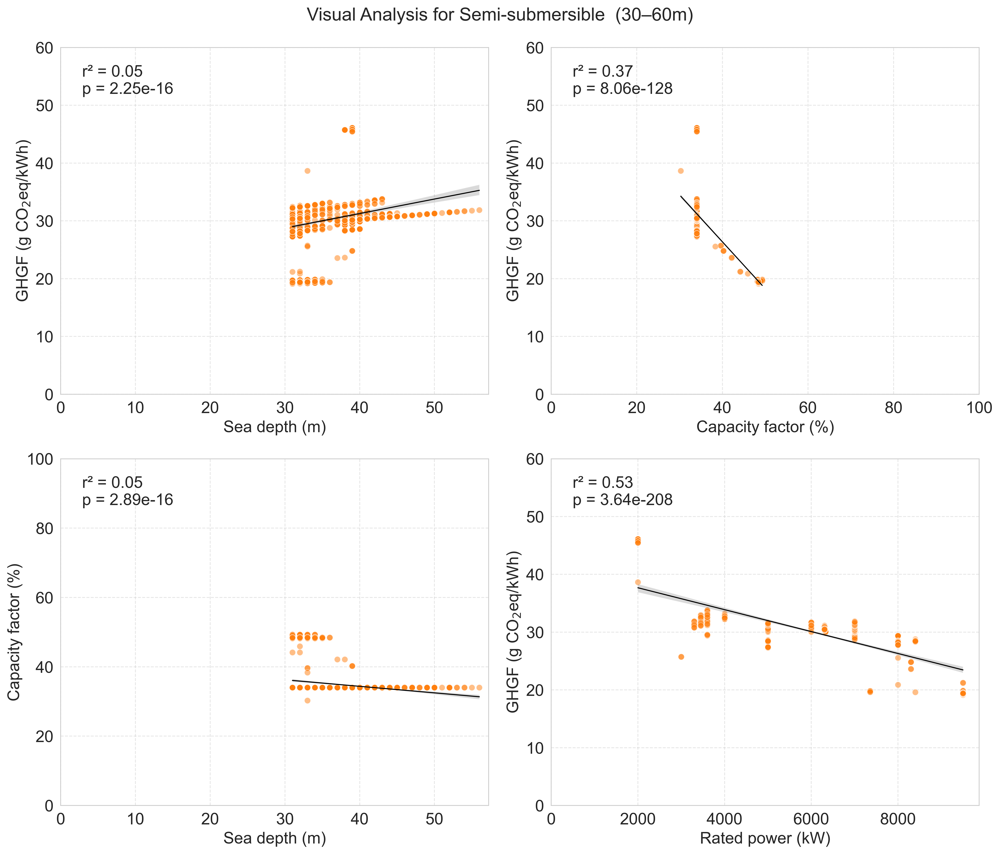

In [62]:
plot_foundation_group_5(offshore_clean, "Monopile (≤30m)", add_trend=True)
plot_foundation_group_5(offshore_clean, "Semi-submersible  (30–60m)", add_trend=True)


In [41]:
import numpy as np

problem_log = []

for ftype in offshore_clean["foundation_type"].unique():
    subset = offshore_clean[offshore_clean["foundation_type"] == ftype]
    numeric_cols = subset.select_dtypes(include=[np.number]).columns.tolist()

    print(f"\n--- Checking foundation type: {ftype} (n={len(subset)}) ---")
    for col in numeric_cols:
        col_data = subset[col]
        if col_data.isna().any():
            print(f"  • {col}: {col_data.isna().sum()} NaNs")
        if col_data.nunique() <= 2:
            print(f"  • {col}: low variance ({col_data.nunique()} unique values)")



--- Checking foundation type: Semi-submersible  (30–60m) (n=1242) ---
  • Offshore: low variance (1 unique values)
  • Maintenance: 1242 NaNs
  • Maintenance: low variance (0 unique values)

--- Checking foundation type: Monopile (≤30m) (n=4065) ---
  • Offshore: low variance (1 unique values)
  • Maintenance: 4065 NaNs
  • Maintenance: low variance (0 unique values)

--- Checking foundation type: Spar-buoy (>60m) (n=2) ---
  • Unnamed: 0: low variance (2 unique values)
  • P_rated_kW: low variance (2 unique values)
  • Hub_height_m: low variance (2 unique values)
  • Diameter_m: low variance (2 unique values)
  • Longitude: low variance (2 unique values)
  • Latitude: low variance (2 unique values)
  • Offshore: low variance (1 unique values)
  • Lifetime_production_kWh: low variance (2 unique values)
  • Capacity_factors: low variance (1 unique values)
  • turbine_age: low variance (2 unique values)
  • Cluster: low variance (1 unique values)
  • park_size: low variance (1 unique va

In [42]:
from sklearn.feature_selection import mutual_info_regression

min_n = 50
target_vars = ["Total_g", "Capacity_factors"]

df_num = offshore_clean.select_dtypes(include=[np.number]).copy()
numeric_vars = df_num.columns.tolist()

rows = []

for ftype in offshore_clean["foundation_type"].unique():
    subset = offshore_clean[offshore_clean["foundation_type"] == ftype]

    if len(subset) < min_n:
        print(f"Skipping {ftype} (n={len(subset)})")
        continue

    pearson = subset[numeric_vars].corr("pearson")
    spearman = subset[numeric_vars].corr("spearman")

    for target in target_vars:
        vars_ex_target = [v for v in numeric_vars if v != target]

        mi_vars = []
        for var in vars_ex_target:
            col = subset[var]
            if col.isna().any():
                continue
            if col.nunique() <= 2:
                continue
            mi_vars.append(var)

        mi_dict = {}
        if mi_vars:
            X = subset[mi_vars].values
            y = subset[target].values
            mi = mutual_info_regression(X, y)
            mi_dict = dict(zip(mi_vars, mi))

        for var in vars_ex_target:
            rows.append({
                "foundation_type": ftype,
                "target": target,
                "variable": var,
                "pearson": pearson.loc[target, var],
                "spearman": spearman.loc[target, var],
                "mutual_info": mi_dict.get(var, np.nan),
                "n": len(subset)
            })

summary_df = pd.DataFrame(rows)


Skipping Spar-buoy (>60m) (n=2)


In [43]:
summary_df

,foundation_type,target,variable,pearson,spearman,mutual_info,n
0,Semi-submersible (30–60m),Total_g,Unnamed: 0,0.007378,0.155669,2.919607,1242
1,Semi-submersible (30–60m),Total_g,P_rated_kW,-0.731142,-0.637554,1.853793,1242
2,Semi-submersible (30–60m),Total_g,Hub_height_m,-0.117737,-0.150255,1.902635,1242
3,Semi-submersible (30–60m),Total_g,Diameter_m,-0.503988,-0.375061,1.699504,1242
4,Semi-submersible (30–60m),Total_g,Longitude,0.174607,0.116163,2.308127,1242
...,...,...,...,...,...,...,...
79,Monopile (≤30m),Capacity_factors,Total,-0.740921,-0.569822,1.643481,4065
80,Monopile (≤30m),Capacity_factors,sea_depth_m,-0.060730,-0.013662,0.530585,4065
81,Monopile (≤30m),Capacity_factors,dist_to_grid_m,-0.125151,-0.149925,0.820789,4065
82,Monopile (≤30m),Capacity_factors,dist_to_grid_km,-0.125151,-0.149925,0.820792,4065


In [76]:
summary_df.to_csv("statistical_summary.csv", index=False)

In [63]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_correlation_heatmap(summary_df, foundation_name, target="Total_g"):
    df_plot = summary_df[
        (summary_df["foundation_type"] == foundation_name) &
        (summary_df["target"] == target)
    ]

    corr_data = df_plot.pivot(index="variable", columns="target", values="pearson")

    plt.figure(figsize=(8, len(corr_data) * 0.4))
    sns.heatmap(corr_data, annot=True, cmap="coolwarm", center=0)
    plt.title(f"Pearson Correlations for {foundation_name} ({target})")
    plt.tight_layout()
    plt.show()


In [64]:
def plot_correlation_bars(summary_df, foundation_name, target="Total_g"):
    df_plot = summary_df[
        (summary_df["foundation_type"] == foundation_name) &
        (summary_df["target"] == target)
    ].copy()

    df_plot["abs_corr"] = df_plot["pearson"].abs()
    df_plot = df_plot.sort_values("abs_corr", ascending=False)

    plt.figure(figsize=(8, 6))
    sns.barplot(data=df_plot, x="abs_corr", y="variable", palette="viridis")
    plt.xlabel("|Pearson correlation|")
    plt.ylabel("Variable")
    plt.title(f"Correlation Strengths for {foundation_name} ({target})")
    plt.tight_layout()
    plt.show()


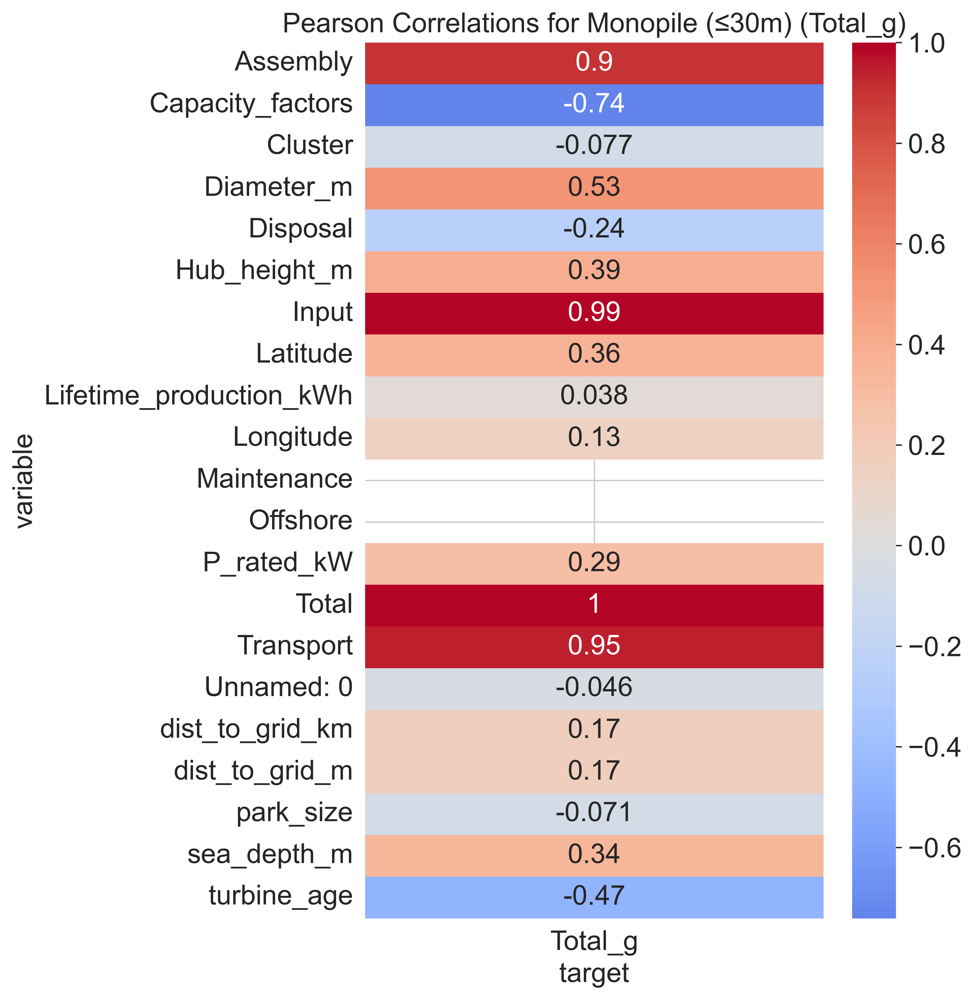

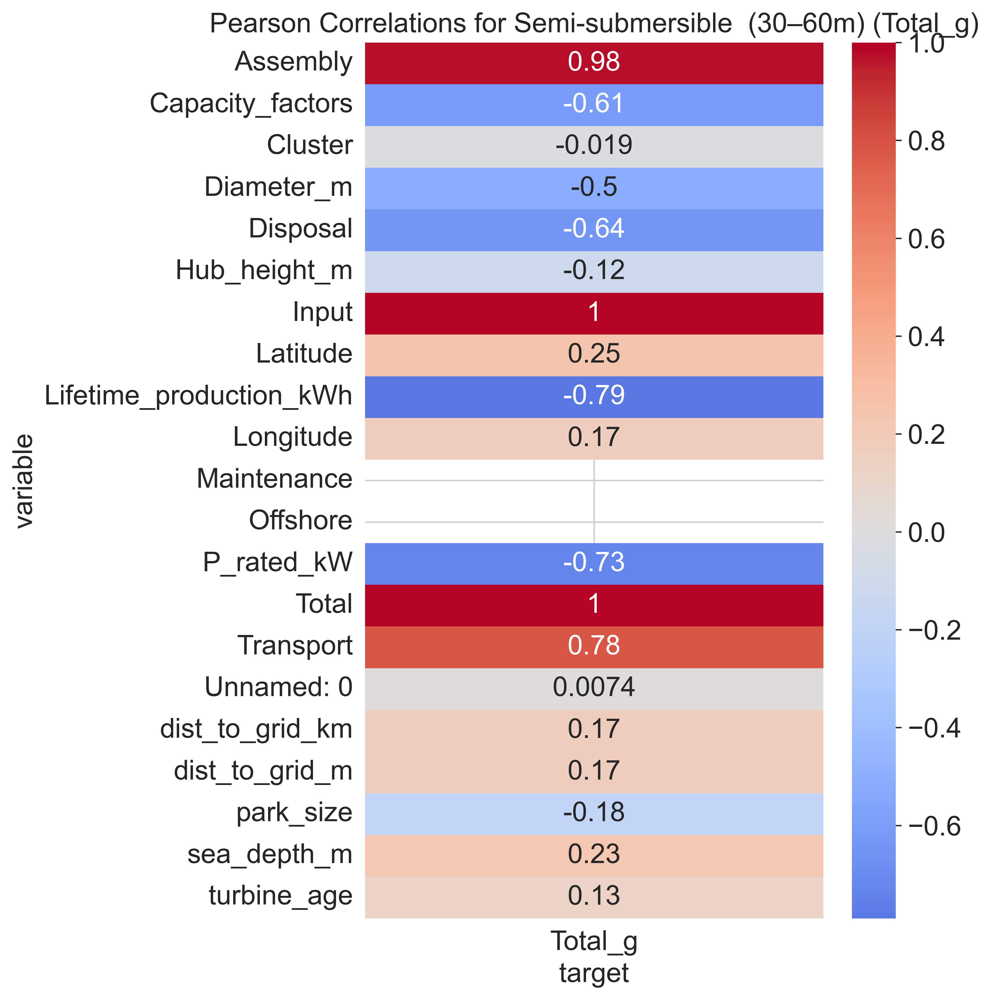

In [65]:
plot_correlation_heatmap(summary_df, "Monopile (≤30m)", target="Total_g")
plot_correlation_heatmap(summary_df, "Semi-submersible  (30–60m)", target="Total_g")

C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\2506906316.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_plot, x="abs_corr", y="variable", palette="viridis")


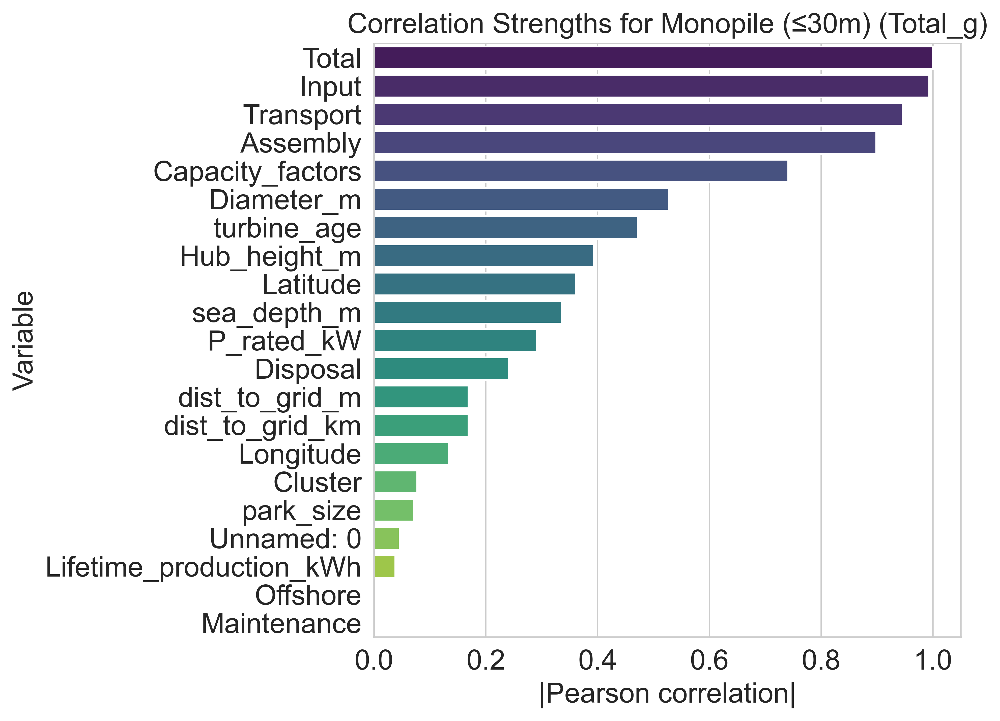

C:\Users\dhuber\AppData\Local\Temp\ipykernel_14556\2506906316.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_plot, x="abs_corr", y="variable", palette="viridis")


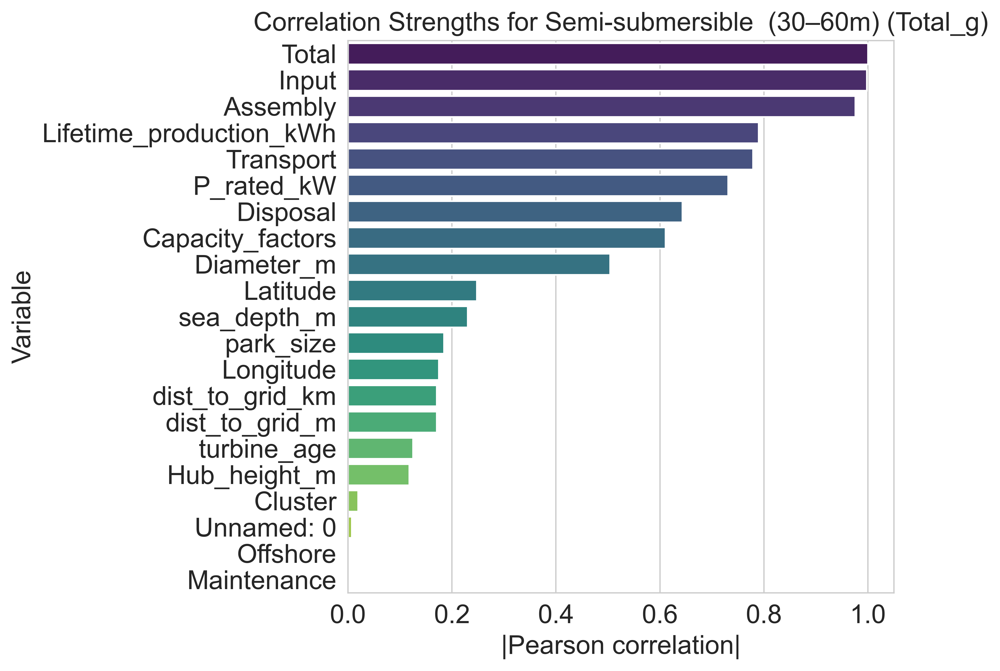

In [66]:
plot_correlation_bars(summary_df, "Monopile (≤30m)", target="Total_g")
plot_correlation_bars(summary_df, "Semi-submersible  (30–60m)", target="Total_g")

###1. Define foundation groups

In [36]:
summary = offshore_clean.groupby('foundation_type').agg({
    'Total_g': ['mean', 'std'],
    'Capacity_factors': ['mean', 'std'],
    'Lifetime_production_kWh': ['mean', 'std'],
    'P_rated_kW': ['mean']
})

print(summary)

                              Total_g           Capacity_factors            \
                                 mean       std             mean       std   
foundation_type                                                              
Monopile (≤30m)             12.427992  2.266839         0.363958  0.055449   
Semi-submersible  (30–60m)  30.436317  4.809007         0.349909  0.036214   
Spar-buoy (>60m)            12.808535  2.653355         0.340000  0.000000   

                           Lifetime_production_kWh                 P_rated_kW  
                                              mean           std         mean  
foundation_type                                                                
Monopile (≤30m)                       2.732428e+08  1.325660e+08  4291.700615  
Semi-submersible  (30–60m)            3.614565e+08  1.439214e+08  5821.168277  
Spar-buoy (>60m)                      2.174232e+08  1.137265e+08  3650.000000  


In [37]:
stage_summary = offshore_clean.groupby('foundation_type')[[
    'Input', 'Assembly', 'Transport', 'Maintenance', 'Disposal'
]].mean()

print(stage_summary)


                               Input  Assembly  Transport  Maintenance  \
foundation_type                                                          
Monopile (≤30m)             0.009631  0.001428   0.001412          NaN   
Semi-submersible  (30–60m)  0.024404  0.004365   0.001701          NaN   
Spar-buoy (>60m)            0.010029  0.001132   0.001686          NaN   

                            Disposal  
foundation_type                       
Monopile (≤30m)            -0.000043  
Semi-submersible  (30–60m) -0.000033  
Spar-buoy (>60m)           -0.000038  


In [75]:
 0.024404/0.009631

2.533900944865538

In [70]:
offshore_clean["impact_per_kW"] = offshore_clean["Total"] * offshore_clean["Lifetime_production_kWh"] / offshore_clean["P_rated_kW"]


In [71]:
comparison = offshore_clean.groupby("foundation_type").agg({
    "Total_g": ["mean", "std"],
    "impact_per_kW": ["mean", "std"],
    "Lifetime_production_kWh": ["mean", "std"],
    "Capacity_factors": ["mean", "std"],
})

print(comparison)


                              Total_g           impact_per_kW              \
                                 mean       std          mean         std   
foundation_type                                                             
Monopile (≤30m)             12.427992  2.266839    772.484808   97.755313   
Semi-submersible  (30–60m)  30.436317  4.809007   1845.574862  233.511745   
Spar-buoy (>60m)            12.808535  2.653355    762.978822  158.055025   

                           Lifetime_production_kWh                \
                                              mean           std   
foundation_type                                                    
Monopile (≤30m)                       2.732428e+08  1.325660e+08   
Semi-submersible  (30–60m)            3.614565e+08  1.439214e+08   
Spar-buoy (>60m)                      2.174232e+08  1.137265e+08   

                           Capacity_factors            
                                       mean       std  
foundation_type 

In [72]:
offshore_clean.groupby('foundation_type')['impact_per_kW'].mean()

foundation_type
Monopile (≤30m)                772.484808
Semi-submersible  (30–60m)    1845.574862
Spar-buoy (>60m)               762.978822
Name: impact_per_kW, dtype: float64